<a href="https://colab.research.google.com/github/JaumePrats/BikeLaneDamageDetection/blob/main/Training_and_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Training and inference

In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



## 1. MMDetection installation

In [2]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5.1+cu101 torchvision==0.6.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

# install Pillow 7.0.0 back in order to avoid bug in colab
!pip install Pillow==7.1.2

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 704.4 MB 1.3 kB/s 
     |████████████████████████████████| 6.6 MB 8.5 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.5.1+cu101 which is incompatible.
     |████████████████████████████████| 313 kB 5.0 MB/s 
     |████████████████████████████████| 185 kB 30.5 MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.3.9-cp37-cp37m-linux

In [3]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.5.1+cu101 True
2.14.0
11.0
GCC 7.5


## 2. Upload pretrained checkpoints

In the thesis the checkpoints used have been previously trained in the [RDDDataset](https://data.mendeley.com/datasets/5ty2wb6gvg/1). 

Base checkpont file used in this thesis: [pretrained_rdd2020.pth](https://drive.google.com/file/d/1Gd1TxZYflZ8S2qOGJ8zE__q3_qU5rY9K/view?usp=sharing)

**To continue with the training download and upload the base cheackpont file inside checkpoints directory.**

In [4]:
%ls

configs/  docs_zh-CN/  mmdet.egg-info/  README_zh-CN.md   setup.cfg
demo/     LICENSE      model-index.yml  requirements/     setup.py*
docker/   MANIFEST.in  pytest.ini       requirements.txt  tests/
docs/     mmdet/       README.md        resources/        tools/


In [5]:
%cd ..
%mkdir checkpoints

/content


## 3. Download BLDD Dataset

The Bike Lane Damage Detection 2021 Dataset is a dataset created during the four months of this project. It contains 370 images of bike lanes from the Barcelona Metropolitan Area with 677 instances of damages. The dataset is unbalanced with two under-represented classes.

The dataset contains annotations in PASCAL VOC and COCO format of the five following classes:

* D00 - Longitudinal Crack
* D10 - Transverse Crack
* D20 - Alligator Crack (under-represented)
* D40 - Pothole (under-represented)
* D50 - Manhole

The dataset has been divided between train set (70%), validation set (20%), and test set (10%):

* Train - 259 images
* Validation - 74 images
* Test - 37 images

In [6]:
%mkdir bldd
%cd bldd
!curl -L "https://app.roboflow.com/ds/M5iv33fv4D?key=dxWWDQvdBk" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
%cd ..

/content/bldd
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0    698      0  0:00:01  0:00:01 --:--:--   698
100 30.8M  100 30.8M    0     0  7252k      0  0:00:04  0:00:04 --:--:-- 16.4M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/IMG_20210218_174553_jpg.rf.edc29964e9d0d6ec8b438b92fa86b25c.jpg  
 extracting: test/IMG_20210225_195628_jpg.rf.6194cee31b3cbc81be96f0dda56d6ce1.jpg  
 extracting: test/IMG_20210225_202842_jpg.rf.62e2e3f7d06475df5c8b36544d033a4e.jpg  
 extracting: test/IMG_3991_jpg.rf.1252db20a3d5f648c15620371fee4754.jpg  
 extracting: test/IMG_4031_jpg.rf.f9b70d9cae47a07ceb400b98623bfa72.jpg  
 extracting: test/IMG_4045_jpg.rf.975b5184abc9fe8e43fd13e00aed2281.jpg  
 extracting: test/IMG_4059_jpg.rf.2b8be9a94d6ed0d5f162206c24bb48a8.jpg  
 extracting: test/IMG_4421_jpg.rf.b3cac278b8aa

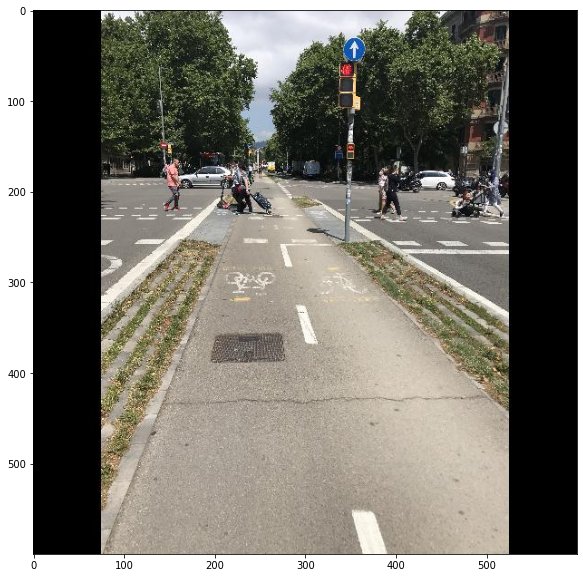

In [7]:
# Let's take a look at a dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('bldd/train/IMG_4748_jpg.rf.7a70370b7b3ef1f4a5dddc999dbc362c.jpg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

## 4. Prepare config files

Several config files can be found in the [github](https://github.com/JaumePrats/BikeLaneDamageDetection) of the project. Here is a short description of each one:

#### **BLDD**
The **base detector** from the project, used as a reference to evaluate the techniques applied in other config files. It is based on the faster_rcnn_r50_caffe_fpn_mstrain_1x_coco config from MMDetection, which uses a Faster R-CNN network with an R50-FPN backbone. (All flip augmentations have been deactivated)

#### **BLDD_DA_PIPELINE** 
In this experiment **data augemntation** is implemented on the fly in the configuration file. The following augmentation strategies are applied:

* Horizontal FLip
* Motion Blur
* Gaussian Noise
* Rotation (between -15 and 15 degrees)
* Brightness
* Cutout (8 squares of 25x25)
* Color Modification

#### **BLDD_DA_FLIP**
To further evaluate the flip transform, this config uses only the *horizontal flip* augmentation during training.

#### **BLDD_DA_BLUR**
To evaluate the effects of using blur augmentation, this config is trained using only *Motion Blur* transform.

In [9]:
# Fisrt we clone BikeLaneDamageDetection
!git clone https://github.com/JaumePrats/BikeLaneDamageDetection.git

Cloning into 'BikeLaneDamageDetection'...
remote: Enumerating objects: 477, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 477 (delta 4), reused 0 (delta 0), pack-reused 450
Receiving objects: 100% (477/477), 118.61 KiB | 421.00 KiB/s, done.
Resolving deltas: 100% (386/386), done.


Load and print the desired config (config_bldd.py in this case):

In [15]:
from mmcv import Config
cfg = Config.fromfile('/content/BikeLaneDamageDetection/configs/config_bldd.py')
print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='FasterRCNN',
    pretrained='open-mmlab://detectron2/resnet50_caffe',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe'),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0),
        los

Edit config to this colab environment:

In [16]:
# Dataset paths
cfg.data_root = '/content/bldd/'
cfg.data.train.data_root = '/content/bldd/train/'
cfg.data.val.data_root = '/content/bldd/valid/'
cfg.data.test.data_root = '/content/bldd/test/'

# Base checkpont file
cfg.load_from = '/content/checkpoints/pretrained_rdd2020.pth'
# Working dir to save files and logs.
cfg.work_dir = '/content/results'

print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='FasterRCNN',
    pretrained='open-mmlab://detectron2/resnet50_caffe',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe'),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.0),
        los

## 5. Training

If you want to skip training and just do inference with trained detectors got to next section

In [18]:
import copy
import os.path as osp

import mmcv
import numpy as np
import matplotlib.pyplot as plt

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/content/mmdetection/mmdet/models/detectors/two_stage.py:28: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmdetection/mmdet/models/backbones/resnet.py:400: UserWarning: DeprecationWarning: pretrained is deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is deprecated, '
/content/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2021-07-21 09:13:19,048 - mmdet - INFO - load checkpoint from /content/checkpoints/pretrained_rdd2020.pth
2021-07-21 09:13:19,050 - mmdet - INFO - Use load_from_local loader


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2021-07-21 09:13:19,675 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([8, 1024]) from checkpoint, the shape in current model is torch.Size([7, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([8]) from checkpoint, the shape in current model is torch.Size([7]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([28, 1024]) from checkpoint, the shape in current model is torch.Size([24, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([28]) from checkpoint, the shape in current model is torch.Size([24]).
2021-07-21 09:13:19,694 - mmdet - INFO - Start running, host: root@ca6f9daaa0e0, work_dir: /content/results
2021-07-21 09:13:19,696 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHook  

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:15:52,871 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-07-21 09:15:53,233 - mmdet - INFO - Epoch(val) [1][74]	bbox_mAP: 0.1630, bbox_mAP_50: 0.4310, bbox_mAP_75: 0.0940, bbox_mAP_s: 0.2840, bbox_mAP_m: 0.1560, bbox_mAP_l: 0.2520, bbox_mAP_copypaste: 0.163 0.431 0.094 0.284 0.156 0.252


DONE (t=0.23s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.163
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.431
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.284
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.156
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.252
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.243
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-07-21 09:16:05,255 - mmdet - INFO - Epoch [2][10/130]	lr: 2.500e-03, eta: 0:30:32, time: 1.148, data_time: 0.227, memory: 2361, loss_rpn_cls: 0.0140, loss_rpn_bbox: 0.0155, loss_cls: 0.1065, acc: 96.4746, loss_bbox: 0.1446, loss: 0.2806
2021-07-21 09:16:14,426 - mmdet - INFO - Epoch [2][20/130]	lr: 2.500e-03, eta: 0:30:11, time: 0.919, data_time: 0.060, memory: 2361, loss_rpn_cls: 0.0291, loss_rpn_bbox: 0.0183, loss_cls: 0.1652, acc: 95.5859, loss_bbox: 0.1668, loss: 0.3794
2021-07-21 09:16:23,921 - mmdet - INFO - Epoch [2][30/130]	lr: 2.500e-03, eta: 0:29:54, time: 0.945, data_time: 0.057, memory: 2361, loss_rpn_cls: 0.0124, loss_rpn_bbox: 0.0157, loss_cls: 0.1107, acc: 96.6992, loss_bbox: 0.1238, loss: 0.2626
2021-07-21 09:16:33,718 - mmdet - INFO - Epoch [2][40/130]	lr: 2.500e-03, eta: 0:29:41, time: 0.978, data_time: 0.062, memory: 2361, loss_rpn_cls: 0.0116, loss_rpn_bbox: 0.0094, loss_cls: 0.0854, acc: 97.2168, loss_bbox: 0.1099, loss: 0.2163
2021-07-21 09:16:43,363 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:18:19,152 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.17s).
Accumulating evaluation results...


2021-07-21 09:18:19,437 - mmdet - INFO - Epoch(val) [2][74]	bbox_mAP: 0.2410, bbox_mAP_50: 0.5290, bbox_mAP_75: 0.1700, bbox_mAP_s: 0.4390, bbox_mAP_m: 0.1950, bbox_mAP_l: 0.3540, bbox_mAP_copypaste: 0.241 0.529 0.170 0.439 0.195 0.354


DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.241
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.529
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.170
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.439
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.195
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.354
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.394
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.394
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.394
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.509
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.532


2021-07-21 09:18:31,285 - mmdet - INFO - Epoch [3][10/130]	lr: 2.500e-03, eta: 0:27:41, time: 1.132, data_time: 0.229, memory: 2361, loss_rpn_cls: 0.0126, loss_rpn_bbox: 0.0213, loss_cls: 0.0914, acc: 96.6504, loss_bbox: 0.1283, loss: 0.2536
2021-07-21 09:18:40,265 - mmdet - INFO - Epoch [3][20/130]	lr: 2.500e-03, eta: 0:27:26, time: 0.901, data_time: 0.059, memory: 2361, loss_rpn_cls: 0.0070, loss_rpn_bbox: 0.0102, loss_cls: 0.0646, acc: 98.0566, loss_bbox: 0.0831, loss: 0.1648
2021-07-21 09:18:49,728 - mmdet - INFO - Epoch [3][30/130]	lr: 2.500e-03, eta: 0:27:13, time: 0.938, data_time: 0.055, memory: 2361, loss_rpn_cls: 0.0175, loss_rpn_bbox: 0.0117, loss_cls: 0.0583, acc: 98.1348, loss_bbox: 0.0932, loss: 0.1807
2021-07-21 09:18:59,613 - mmdet - INFO - Epoch [3][40/130]	lr: 2.500e-03, eta: 0:27:03, time: 0.989, data_time: 0.064, memory: 2361, loss_rpn_cls: 0.0074, loss_rpn_bbox: 0.0145, loss_cls: 0.0895, acc: 96.8848, loss_bbox: 0.1276, loss: 0.2390
2021-07-21 09:19:09,382 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:20:45,650 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-07-21 09:20:45,867 - mmdet - INFO - Epoch(val) [3][74]	bbox_mAP: 0.2770, bbox_mAP_50: 0.6190, bbox_mAP_75: 0.1870, bbox_mAP_s: 0.4390, bbox_mAP_m: 0.2350, bbox_mAP_l: 0.4100, bbox_mAP_copypaste: 0.277 0.619 0.187 0.439 0.235 0.410


DONE (t=0.13s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.277
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.619
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.187
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.439
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.235
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.410
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.535
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-07-21 09:20:57,884 - mmdet - INFO - Epoch [4][10/130]	lr: 2.500e-03, eta: 0:25:21, time: 1.147, data_time: 0.227, memory: 2361, loss_rpn_cls: 0.0056, loss_rpn_bbox: 0.0114, loss_cls: 0.0845, acc: 96.7285, loss_bbox: 0.1159, loss: 0.2174
2021-07-21 09:21:07,047 - mmdet - INFO - Epoch [4][20/130]	lr: 2.500e-03, eta: 0:25:09, time: 0.920, data_time: 0.060, memory: 2361, loss_rpn_cls: 0.0059, loss_rpn_bbox: 0.0063, loss_cls: 0.0543, acc: 98.0664, loss_bbox: 0.0806, loss: 0.1471
2021-07-21 09:21:16,722 - mmdet - INFO - Epoch [4][30/130]	lr: 2.500e-03, eta: 0:24:59, time: 0.960, data_time: 0.056, memory: 2361, loss_rpn_cls: 0.0062, loss_rpn_bbox: 0.0128, loss_cls: 0.0648, acc: 97.7051, loss_bbox: 0.0792, loss: 0.1630
2021-07-21 09:21:26,711 - mmdet - INFO - Epoch [4][40/130]	lr: 2.500e-03, eta: 0:24:49, time: 0.998, data_time: 0.064, memory: 2361, loss_rpn_cls: 0.0084, loss_rpn_bbox: 0.0154, loss_cls: 0.0819, acc: 97.2363, loss_bbox: 0.0986, loss: 0.2042
2021-07-21 09:21:36,504 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:23:12,643 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-07-21 09:23:12,859 - mmdet - INFO - Epoch(val) [4][74]	bbox_mAP: 0.2520, bbox_mAP_50: 0.6180, bbox_mAP_75: 0.1530, bbox_mAP_s: 0.4430, bbox_mAP_m: 0.2220, bbox_mAP_l: 0.3190, bbox_mAP_copypaste: 0.252 0.618 0.153 0.443 0.222 0.319


DONE (t=0.13s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.252
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.618
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.153
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.443
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.523
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-07-21 09:23:24,698 - mmdet - INFO - Epoch [5][10/130]	lr: 2.500e-03, eta: 0:23:09, time: 1.129, data_time: 0.228, memory: 2361, loss_rpn_cls: 0.0035, loss_rpn_bbox: 0.0115, loss_cls: 0.0737, acc: 97.3340, loss_bbox: 0.1098, loss: 0.1985
2021-07-21 09:23:33,866 - mmdet - INFO - Epoch [5][20/130]	lr: 2.500e-03, eta: 0:22:58, time: 0.922, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0049, loss_rpn_bbox: 0.0182, loss_cls: 0.0620, acc: 97.7148, loss_bbox: 0.0916, loss: 0.1767
2021-07-21 09:23:43,268 - mmdet - INFO - Epoch [5][30/130]	lr: 2.500e-03, eta: 0:22:47, time: 0.935, data_time: 0.056, memory: 2361, loss_rpn_cls: 0.0041, loss_rpn_bbox: 0.0113, loss_cls: 0.0573, acc: 97.8027, loss_bbox: 0.0898, loss: 0.1625
2021-07-21 09:23:53,059 - mmdet - INFO - Epoch [5][40/130]	lr: 2.500e-03, eta: 0:22:37, time: 0.978, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0075, loss_rpn_bbox: 0.0182, loss_cls: 0.0771, acc: 96.7285, loss_bbox: 0.1152, loss: 0.2180
2021-07-21 09:24:02,703 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:25:38,924 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...


2021-07-21 09:25:39,189 - mmdet - INFO - Epoch(val) [5][74]	bbox_mAP: 0.2700, bbox_mAP_50: 0.6170, bbox_mAP_75: 0.2140, bbox_mAP_s: 0.4380, bbox_mAP_m: 0.2130, bbox_mAP_l: 0.4460, bbox_mAP_copypaste: 0.270 0.617 0.214 0.438 0.213 0.446


DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.617
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.214
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.438
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.213
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.446
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.535
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.521


2021-07-21 09:25:50,998 - mmdet - INFO - Epoch [6][10/130]	lr: 2.500e-03, eta: 0:20:59, time: 1.126, data_time: 0.228, memory: 2361, loss_rpn_cls: 0.0058, loss_rpn_bbox: 0.0132, loss_cls: 0.0618, acc: 97.7148, loss_bbox: 0.1012, loss: 0.1821
2021-07-21 09:26:00,088 - mmdet - INFO - Epoch [6][20/130]	lr: 2.500e-03, eta: 0:20:48, time: 0.913, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0050, loss_rpn_bbox: 0.0070, loss_cls: 0.0393, acc: 98.5352, loss_bbox: 0.0608, loss: 0.1121
2021-07-21 09:26:09,511 - mmdet - INFO - Epoch [6][30/130]	lr: 2.500e-03, eta: 0:20:37, time: 0.936, data_time: 0.057, memory: 2361, loss_rpn_cls: 0.0042, loss_rpn_bbox: 0.0156, loss_cls: 0.0729, acc: 97.3535, loss_bbox: 0.0997, loss: 0.1924
2021-07-21 09:26:19,209 - mmdet - INFO - Epoch [6][40/130]	lr: 2.500e-03, eta: 0:20:27, time: 0.969, data_time: 0.063, memory: 2361, loss_rpn_cls: 0.0075, loss_rpn_bbox: 0.0214, loss_cls: 0.0468, acc: 98.1738, loss_bbox: 0.0845, loss: 0.1602
2021-07-21 09:26:28,873 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 20s, ETA:     0s

2021-07-21 09:28:04,927 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.11s).
Accumulating evaluation results...


2021-07-21 09:28:05,123 - mmdet - INFO - Epoch(val) [6][74]	bbox_mAP: 0.2800, bbox_mAP_50: 0.6240, bbox_mAP_75: 0.1670, bbox_mAP_s: 0.4160, bbox_mAP_m: 0.2600, bbox_mAP_l: 0.3990, bbox_mAP_copypaste: 0.280 0.624 0.167 0.416 0.260 0.399


DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.280
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.624
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.167
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.416
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.260
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.399
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.459
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.492


2021-07-21 09:28:16,933 - mmdet - INFO - Epoch [7][10/130]	lr: 2.500e-03, eta: 0:18:49, time: 1.126, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0033, loss_rpn_bbox: 0.0134, loss_cls: 0.0581, acc: 97.7539, loss_bbox: 0.0940, loss: 0.1689
2021-07-21 09:28:25,926 - mmdet - INFO - Epoch [7][20/130]	lr: 2.500e-03, eta: 0:18:38, time: 0.904, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0027, loss_rpn_bbox: 0.0156, loss_cls: 0.0566, acc: 97.8320, loss_bbox: 0.0982, loss: 0.1731
2021-07-21 09:28:35,323 - mmdet - INFO - Epoch [7][30/130]	lr: 2.500e-03, eta: 0:18:28, time: 0.933, data_time: 0.056, memory: 2361, loss_rpn_cls: 0.0020, loss_rpn_bbox: 0.0067, loss_cls: 0.0423, acc: 98.4473, loss_bbox: 0.0736, loss: 0.1246
2021-07-21 09:28:45,041 - mmdet - INFO - Epoch [7][40/130]	lr: 2.500e-03, eta: 0:18:18, time: 0.972, data_time: 0.063, memory: 2361, loss_rpn_cls: 0.0039, loss_rpn_bbox: 0.0067, loss_cls: 0.0428, acc: 98.3398, loss_bbox: 0.0732, loss: 0.1266
2021-07-21 09:28:54,675 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:30:30,681 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-07-21 09:30:30,896 - mmdet - INFO - Epoch(val) [7][74]	bbox_mAP: 0.3050, bbox_mAP_50: 0.6680, bbox_mAP_75: 0.2270, bbox_mAP_s: 0.4680, bbox_mAP_m: 0.2960, bbox_mAP_l: 0.4050, bbox_mAP_copypaste: 0.305 0.668 0.227 0.468 0.296 0.405


DONE (t=0.13s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.668
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.227
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.296
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.536
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.387
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-07-21 09:30:42,757 - mmdet - INFO - Epoch [8][10/130]	lr: 2.500e-03, eta: 0:16:41, time: 1.130, data_time: 0.227, memory: 2361, loss_rpn_cls: 0.0027, loss_rpn_bbox: 0.0115, loss_cls: 0.0438, acc: 98.2227, loss_bbox: 0.0816, loss: 0.1395
2021-07-21 09:30:51,894 - mmdet - INFO - Epoch [8][20/130]	lr: 2.500e-03, eta: 0:16:30, time: 0.920, data_time: 0.062, memory: 2361, loss_rpn_cls: 0.0034, loss_rpn_bbox: 0.0118, loss_cls: 0.0459, acc: 98.2227, loss_bbox: 0.0784, loss: 0.1394
2021-07-21 09:31:01,401 - mmdet - INFO - Epoch [8][30/130]	lr: 2.500e-03, eta: 0:16:20, time: 0.944, data_time: 0.055, memory: 2361, loss_rpn_cls: 0.0027, loss_rpn_bbox: 0.0095, loss_cls: 0.0428, acc: 98.3984, loss_bbox: 0.0803, loss: 0.1353
2021-07-21 09:31:11,140 - mmdet - INFO - Epoch [8][40/130]	lr: 2.500e-03, eta: 0:16:11, time: 0.975, data_time: 0.062, memory: 2361, loss_rpn_cls: 0.0029, loss_rpn_bbox: 0.0153, loss_cls: 0.0506, acc: 97.8418, loss_bbox: 0.1071, loss: 0.1759
2021-07-21 09:31:20,790 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:32:56,873 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2021-07-21 09:32:57,073 - mmdet - INFO - Epoch(val) [8][74]	bbox_mAP: 0.3100, bbox_mAP_50: 0.6460, bbox_mAP_75: 0.2640, bbox_mAP_s: 0.4890, bbox_mAP_m: 0.3090, bbox_mAP_l: 0.4700, bbox_mAP_copypaste: 0.310 0.646 0.264 0.489 0.309 0.470


DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.310
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.646
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.264
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.489
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.309
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.470
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.403
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.403
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.403
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.545
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.390
 Average Recall     (AR) @[ IoU=0.50:0.95 | a

2021-07-21 09:33:08,891 - mmdet - INFO - Epoch [9][10/130]	lr: 2.500e-04, eta: 0:14:33, time: 1.128, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0040, loss_rpn_bbox: 0.0175, loss_cls: 0.0444, acc: 98.2227, loss_bbox: 0.0803, loss: 0.1462
2021-07-21 09:33:18,010 - mmdet - INFO - Epoch [9][20/130]	lr: 2.500e-04, eta: 0:14:23, time: 0.916, data_time: 0.060, memory: 2361, loss_rpn_cls: 0.0026, loss_rpn_bbox: 0.0119, loss_cls: 0.0373, acc: 98.6035, loss_bbox: 0.0717, loss: 0.1236
2021-07-21 09:33:27,409 - mmdet - INFO - Epoch [9][30/130]	lr: 2.500e-04, eta: 0:14:13, time: 0.935, data_time: 0.056, memory: 2361, loss_rpn_cls: 0.0042, loss_rpn_bbox: 0.0111, loss_cls: 0.0591, acc: 97.7051, loss_bbox: 0.0998, loss: 0.1742
2021-07-21 09:33:37,236 - mmdet - INFO - Epoch [9][40/130]	lr: 2.500e-04, eta: 0:14:03, time: 0.980, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0023, loss_rpn_bbox: 0.0055, loss_cls: 0.0442, acc: 98.5449, loss_bbox: 0.0630, loss: 0.1150
2021-07-21 09:33:46,922 - mmdet 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:35:23,271 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.10s).
Accumulating evaluation results...


2021-07-21 09:35:23,454 - mmdet - INFO - Epoch(val) [9][74]	bbox_mAP: 0.3130, bbox_mAP_50: 0.6490, bbox_mAP_75: 0.2460, bbox_mAP_s: 0.4650, bbox_mAP_m: 0.3030, bbox_mAP_l: 0.4890, bbox_mAP_copypaste: 0.313 0.649 0.246 0.465 0.303 0.489


DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.649
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.246
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.465
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.303
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.489
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.539
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.535


2021-07-21 09:35:35,281 - mmdet - INFO - Epoch [10][10/130]	lr: 2.500e-04, eta: 0:12:27, time: 1.130, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0043, loss_rpn_bbox: 0.0108, loss_cls: 0.0371, acc: 98.5645, loss_bbox: 0.0616, loss: 0.1137
2021-07-21 09:35:44,395 - mmdet - INFO - Epoch [10][20/130]	lr: 2.500e-04, eta: 0:12:17, time: 0.915, data_time: 0.059, memory: 2361, loss_rpn_cls: 0.0017, loss_rpn_bbox: 0.0065, loss_cls: 0.0391, acc: 98.4863, loss_bbox: 0.0732, loss: 0.1206
2021-07-21 09:35:53,888 - mmdet - INFO - Epoch [10][30/130]	lr: 2.500e-04, eta: 0:12:07, time: 0.941, data_time: 0.056, memory: 2361, loss_rpn_cls: 0.0043, loss_rpn_bbox: 0.0105, loss_cls: 0.0466, acc: 98.1641, loss_bbox: 0.0870, loss: 0.1484
2021-07-21 09:36:03,661 - mmdet - INFO - Epoch [10][40/130]	lr: 2.500e-04, eta: 0:11:57, time: 0.979, data_time: 0.064, memory: 2361, loss_rpn_cls: 0.0017, loss_rpn_bbox: 0.0086, loss_cls: 0.0359, acc: 98.6133, loss_bbox: 0.0696, loss: 0.1158
2021-07-21 09:36:13,324 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:37:49,470 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.09s).
Accumulating evaluation results...


2021-07-21 09:37:49,641 - mmdet - INFO - Epoch(val) [10][74]	bbox_mAP: 0.3190, bbox_mAP_50: 0.6480, bbox_mAP_75: 0.2540, bbox_mAP_s: 0.4730, bbox_mAP_m: 0.3000, bbox_mAP_l: 0.5300, bbox_mAP_copypaste: 0.319 0.648 0.254 0.473 0.300 0.530


DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.648
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.254
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.473
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.530
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.422
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.422
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.422
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.551
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.374
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.580


2021-07-21 09:38:01,485 - mmdet - INFO - Epoch [11][10/130]	lr: 2.500e-04, eta: 0:10:20, time: 1.131, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0014, loss_rpn_bbox: 0.0083, loss_cls: 0.0354, acc: 98.7402, loss_bbox: 0.0708, loss: 0.1159
2021-07-21 09:38:10,517 - mmdet - INFO - Epoch [11][20/130]	lr: 2.500e-04, eta: 0:10:10, time: 0.907, data_time: 0.060, memory: 2361, loss_rpn_cls: 0.0017, loss_rpn_bbox: 0.0043, loss_cls: 0.0286, acc: 98.8379, loss_bbox: 0.0511, loss: 0.0858
2021-07-21 09:38:19,960 - mmdet - INFO - Epoch [11][30/130]	lr: 2.500e-04, eta: 0:10:00, time: 0.938, data_time: 0.056, memory: 2361, loss_rpn_cls: 0.0017, loss_rpn_bbox: 0.0101, loss_cls: 0.0380, acc: 98.3691, loss_bbox: 0.0744, loss: 0.1242
2021-07-21 09:38:29,693 - mmdet - INFO - Epoch [11][40/130]	lr: 2.500e-04, eta: 0:09:51, time: 0.972, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0039, loss_rpn_bbox: 0.0110, loss_cls: 0.0374, acc: 98.3203, loss_bbox: 0.0733, loss: 0.1256
2021-07-21 09:38:39,352 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:40:15,719 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.09s).
Accumulating evaluation results...


2021-07-21 09:40:15,891 - mmdet - INFO - Epoch(val) [11][74]	bbox_mAP: 0.3110, bbox_mAP_50: 0.6460, bbox_mAP_75: 0.2380, bbox_mAP_s: 0.5050, bbox_mAP_m: 0.2940, bbox_mAP_l: 0.5070, bbox_mAP_copypaste: 0.311 0.646 0.238 0.505 0.294 0.507


DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.646
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.294
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.507
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.579
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.374
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.560


2021-07-21 09:40:27,784 - mmdet - INFO - Epoch [12][10/130]	lr: 2.500e-05, eta: 0:08:14, time: 1.134, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0028, loss_rpn_bbox: 0.0106, loss_cls: 0.0413, acc: 98.4863, loss_bbox: 0.0750, loss: 0.1296
2021-07-21 09:40:36,860 - mmdet - INFO - Epoch [12][20/130]	lr: 2.500e-05, eta: 0:08:04, time: 0.913, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0052, loss_rpn_bbox: 0.0106, loss_cls: 0.0455, acc: 98.1445, loss_bbox: 0.0810, loss: 0.1422
2021-07-21 09:40:46,382 - mmdet - INFO - Epoch [12][30/130]	lr: 2.500e-05, eta: 0:07:54, time: 0.943, data_time: 0.055, memory: 2361, loss_rpn_cls: 0.0034, loss_rpn_bbox: 0.0115, loss_cls: 0.0364, acc: 98.6426, loss_bbox: 0.0726, loss: 0.1240
2021-07-21 09:40:56,223 - mmdet - INFO - Epoch [12][40/130]	lr: 2.500e-05, eta: 0:07:45, time: 0.985, data_time: 0.065, memory: 2361, loss_rpn_cls: 0.0030, loss_rpn_bbox: 0.0165, loss_cls: 0.0400, acc: 98.3105, loss_bbox: 0.0800, loss: 0.1395
2021-07-21 09:41:05,859 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:42:42,224 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.10s).
Accumulating evaluation results...


2021-07-21 09:42:42,401 - mmdet - INFO - Epoch(val) [12][74]	bbox_mAP: 0.3080, bbox_mAP_50: 0.6480, bbox_mAP_75: 0.2380, bbox_mAP_s: 0.5020, bbox_mAP_m: 0.2930, bbox_mAP_l: 0.5180, bbox_mAP_copypaste: 0.308 0.648 0.238 0.502 0.293 0.518


DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.308
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.648
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.502
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.518
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.574
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.370
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.578


2021-07-21 09:42:54,236 - mmdet - INFO - Epoch [13][10/130]	lr: 2.500e-05, eta: 0:06:08, time: 1.131, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0023, loss_rpn_bbox: 0.0105, loss_cls: 0.0427, acc: 98.1738, loss_bbox: 0.0855, loss: 0.1410
2021-07-21 09:43:03,346 - mmdet - INFO - Epoch [13][20/130]	lr: 2.500e-05, eta: 0:05:58, time: 0.911, data_time: 0.058, memory: 2361, loss_rpn_cls: 0.0026, loss_rpn_bbox: 0.0133, loss_cls: 0.0405, acc: 98.5156, loss_bbox: 0.0656, loss: 0.1219
2021-07-21 09:43:12,757 - mmdet - INFO - Epoch [13][30/130]	lr: 2.500e-05, eta: 0:05:48, time: 0.936, data_time: 0.058, memory: 2361, loss_rpn_cls: 0.0016, loss_rpn_bbox: 0.0051, loss_cls: 0.0342, acc: 98.6133, loss_bbox: 0.0610, loss: 0.1018
2021-07-21 09:43:22,447 - mmdet - INFO - Epoch [13][40/130]	lr: 2.500e-05, eta: 0:05:38, time: 0.969, data_time: 0.063, memory: 2361, loss_rpn_cls: 0.0034, loss_rpn_bbox: 0.0099, loss_cls: 0.0356, acc: 98.6914, loss_bbox: 0.0621, loss: 0.1111
2021-07-21 09:43:32,135 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:45:08,617 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.09s).
Accumulating evaluation results...


2021-07-21 09:45:08,786 - mmdet - INFO - Epoch(val) [13][74]	bbox_mAP: 0.3090, bbox_mAP_50: 0.6470, bbox_mAP_75: 0.2410, bbox_mAP_s: 0.4990, bbox_mAP_m: 0.2910, bbox_mAP_l: 0.5190, bbox_mAP_copypaste: 0.309 0.647 0.241 0.499 0.291 0.519


DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.647
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.241
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.499
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.291
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.519
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.572
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.370
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.577


2021-07-21 09:45:20,590 - mmdet - INFO - Epoch [14][10/130]	lr: 2.500e-05, eta: 0:04:02, time: 1.127, data_time: 0.227, memory: 2361, loss_rpn_cls: 0.0018, loss_rpn_bbox: 0.0081, loss_cls: 0.0361, acc: 98.5449, loss_bbox: 0.0662, loss: 0.1122
2021-07-21 09:45:29,754 - mmdet - INFO - Epoch [14][20/130]	lr: 2.500e-05, eta: 0:03:52, time: 0.915, data_time: 0.059, memory: 2361, loss_rpn_cls: 0.0012, loss_rpn_bbox: 0.0103, loss_cls: 0.0379, acc: 98.4570, loss_bbox: 0.0799, loss: 0.1294
2021-07-21 09:45:39,228 - mmdet - INFO - Epoch [14][30/130]	lr: 2.500e-05, eta: 0:03:42, time: 0.946, data_time: 0.061, memory: 2361, loss_rpn_cls: 0.0022, loss_rpn_bbox: 0.0046, loss_cls: 0.0330, acc: 98.7109, loss_bbox: 0.0627, loss: 0.1024
2021-07-21 09:45:48,969 - mmdet - INFO - Epoch [14][40/130]	lr: 2.500e-05, eta: 0:03:33, time: 0.974, data_time: 0.062, memory: 2361, loss_rpn_cls: 0.0015, loss_rpn_bbox: 0.0110, loss_cls: 0.0308, acc: 98.8672, loss_bbox: 0.0668, loss: 0.1102
2021-07-21 09:45:58,673 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:47:34,975 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.10s).
Accumulating evaluation results...


2021-07-21 09:47:35,160 - mmdet - INFO - Epoch(val) [14][74]	bbox_mAP: 0.3110, bbox_mAP_50: 0.6500, bbox_mAP_75: 0.2420, bbox_mAP_s: 0.4980, bbox_mAP_m: 0.2910, bbox_mAP_l: 0.5190, bbox_mAP_copypaste: 0.311 0.650 0.242 0.498 0.291 0.519


DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.650
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.291
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.519
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.571
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.578


2021-07-21 09:47:46,980 - mmdet - INFO - Epoch [15][10/130]	lr: 2.500e-05, eta: 0:01:56, time: 1.129, data_time: 0.226, memory: 2361, loss_rpn_cls: 0.0045, loss_rpn_bbox: 0.0150, loss_cls: 0.0407, acc: 98.4375, loss_bbox: 0.0737, loss: 0.1340
2021-07-21 09:47:56,031 - mmdet - INFO - Epoch [15][20/130]	lr: 2.500e-05, eta: 0:01:46, time: 0.909, data_time: 0.059, memory: 2361, loss_rpn_cls: 0.0023, loss_rpn_bbox: 0.0121, loss_cls: 0.0340, acc: 98.7305, loss_bbox: 0.0601, loss: 0.1086
2021-07-21 09:48:05,530 - mmdet - INFO - Epoch [15][30/130]	lr: 2.500e-05, eta: 0:01:36, time: 0.943, data_time: 0.055, memory: 2361, loss_rpn_cls: 0.0017, loss_rpn_bbox: 0.0086, loss_cls: 0.0414, acc: 98.3301, loss_bbox: 0.0792, loss: 0.1310
2021-07-21 09:48:15,321 - mmdet - INFO - Epoch [15][40/130]	lr: 2.500e-05, eta: 0:01:27, time: 0.978, data_time: 0.062, memory: 2361, loss_rpn_cls: 0.0022, loss_rpn_bbox: 0.0071, loss_cls: 0.0398, acc: 98.4668, loss_bbox: 0.0527, loss: 0.1017
2021-07-21 09:48:24,966 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 74/74, 3.8 task/s, elapsed: 19s, ETA:     0s

2021-07-21 09:50:01,325 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.10s).
Accumulating evaluation results...


2021-07-21 09:50:01,505 - mmdet - INFO - Epoch(val) [15][74]	bbox_mAP: 0.3150, bbox_mAP_50: 0.6470, bbox_mAP_75: 0.2420, bbox_mAP_s: 0.5030, bbox_mAP_m: 0.2940, bbox_mAP_l: 0.5210, bbox_mAP_copypaste: 0.315 0.647 0.242 0.503 0.294 0.521


DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.647
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.503
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.294
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.521
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.418
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.574
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.580


plot trainig and validation curves using Tensorboard:

In [19]:
%load_ext tensorboard
%tensorboard --logdir /content/results/

<IPython.core.display.Javascript object>

## 6. Inference 

In this section we use the trained model to do inference in test images.
In this example we use the checkpoints from epoch 10, it is recomended to use the chechpoints that obtain the highest mAP in validation (can be seen in tensorboards above).

If you skipped the training section, here are some trained checkpoint files. To use them, upload and change checkpoint file path in the cell bellow.


/content/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_local loader


/content/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


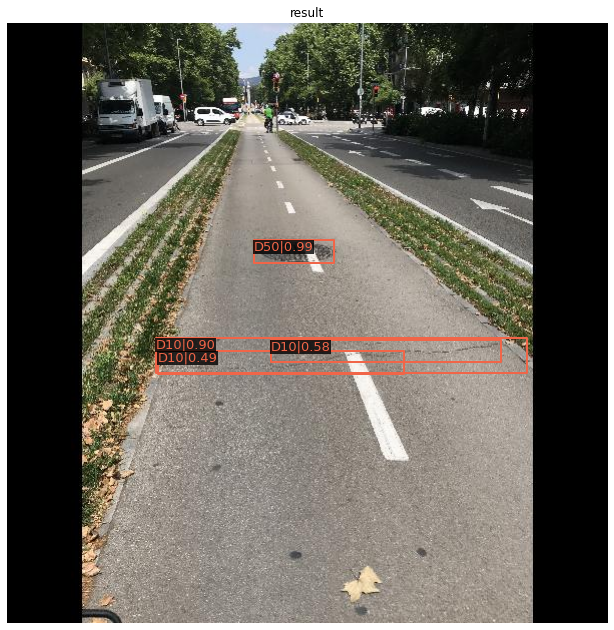

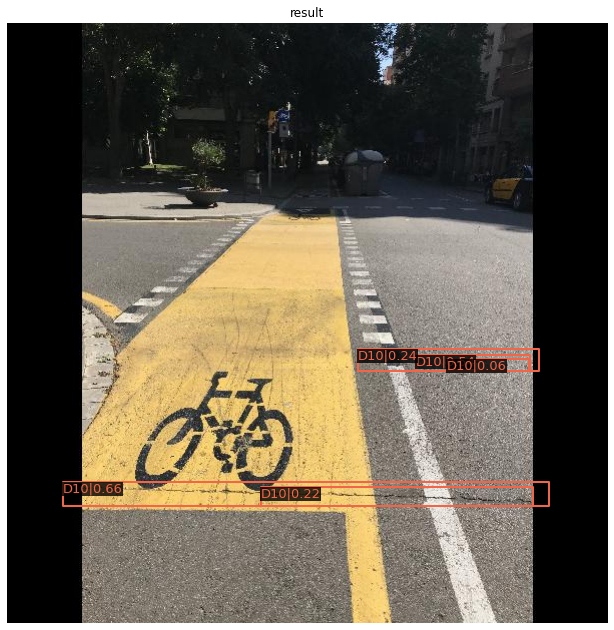

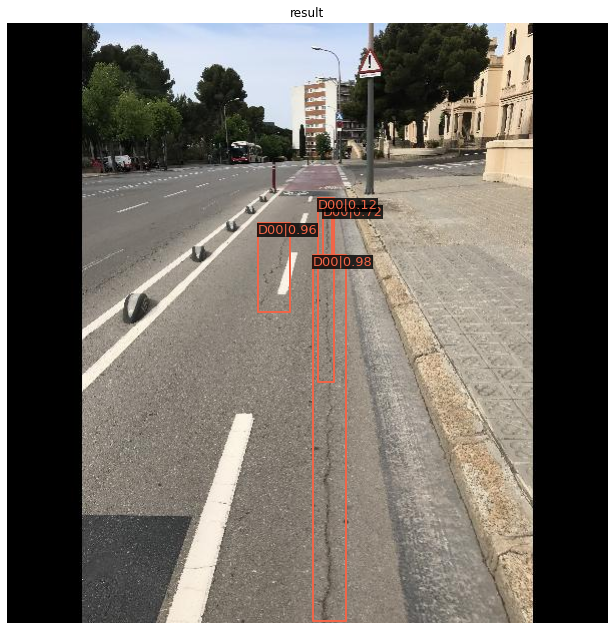

In [23]:
import os
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import mmcv

#Model initialitation (change the checkpoint file to the one you prefer)
model = init_detector('/content/BikeLaneDamageDetection/configs/config_bldd.py', '/content/results/epoch_10.pth', device='cuda:0')

#Models inference
inference1 = inference_detector(model,'/content/bldd/test/IMG_4745_jpg.rf.2c594ca1a3f37ab489c0b7d2cda328a7.jpg' )
inference2 = inference_detector(model,'/content/bldd/test/IMG_4655_jpg.rf.d0b8cc6bcd75f0debfebecdc9a722db9.jpg' )
inference3 = inference_detector(model,'/content/bldd/test/IMG_4444_jpg.rf.dcb4ecf9b39b87691f3da201c699c514.jpg' )

#Show the results
show_result_pyplot(model, '/content/bldd/test/IMG_4745_jpg.rf.2c594ca1a3f37ab489c0b7d2cda328a7.jpg', inference1, score_thr=0)
show_result_pyplot(model, '/content/bldd/test/IMG_4655_jpg.rf.d0b8cc6bcd75f0debfebecdc9a722db9.jpg', inference2, score_thr=0)
show_result_pyplot(model, '/content/bldd/test/IMG_4444_jpg.rf.dcb4ecf9b39b87691f3da201c699c514.jpg', inference3, score_thr=0)